In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

In [ ]:
df=pd.read_csv("C:/Users/parth/Desktop/h2o/dataset/water_potability.csv")

In [ ]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [ ]:
df.tail()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1
3275,7.874671,195.102299,17404.177061,7.509306,NaN,327.459760,16.140368,78.698446,2.309149,1


In [ ]:
df.shape


(3276, 10)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ph,2785.0,7.080795,1.594320,0.000000,6.093092,7.036752,8.062066,14.000000
Hardness,3276.0,196.369496,32.879761,47.432000,176.850538,196.967627,216.667456,323.124000
Solids,3276.0,22014.092526,8768.570828,320.942611,15666.690297,20927.833607,27332.762127,61227.196008
Chloramines,3276.0,7.122277,1.583085,0.352000,6.127421,7.130299,8.114887,13.127000
Sulfate,2495.0,333.775777,41.416840,129.000000,307.699498,333.073546,359.950170,481.030642
Conductivity,3276.0,426.205111,80.824064,181.483754,365.734414,421.884968,481.792304,753.342620
Organic_carbon,3276.0,14.284970,3.308162,2.200000,12.065801,14.218338,16.557652,28.300000
Trihalomethanes,3114.0,66.396293,16.175008,0.738000,55.844536,66.622485,77.337473,124.000000
Turbidity,3276.0,3.966786,0.780382,1.450000,3.439711,3.955028,4.500320,6.739000
Potability,3276.0,0.390110,0.487849,0.000000,0.000000,0.000000,1.000000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
df.apply(lambda x: x.nunique())

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [ ]:
columns = ['ph',  'Sulfate',  'Trihalomethanes']

for column_name in columns:
    # Calculate skewness
    skewness = df[column_name].skew()

    # Print skewness
    print(f"Skewness of {column_name}: {skewness}")

Skewness of ph: 0.025630447632210205
Skewness of Sulfate: -0.03594662160706187
Skewness of Trihalomethanes: -0.08303067407901553


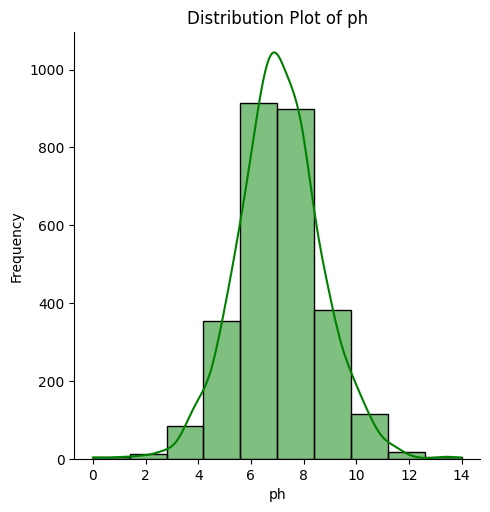

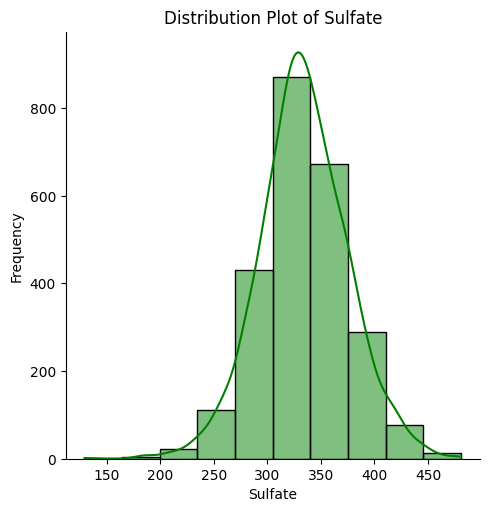

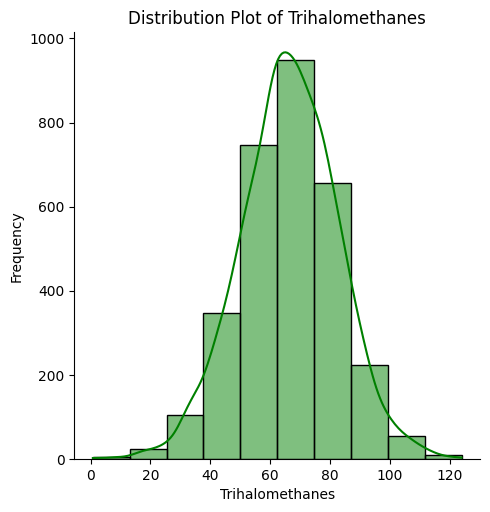

In [ ]:
columns = ['ph',  'Sulfate',  'Trihalomethanes']

for column_name in columns:
    # Create a distribution plot (displot)
    sns.displot(df[column_name], bins=10, kde=True, color='green', edgecolor='black')

    # Add labels and title
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.title(f'Distribution Plot of {column_name}')

    # Show the plot
    plt.show()

In [ ]:
df['ph']=df['ph'].fillna(df.groupby(['Potability'])['ph'].transform('mean'))
df['Sulfate']=df['Sulfate'].fillna(df.groupby(['Potability'])['Sulfate'].transform('median'))
df['Trihalomethanes']=df['Trihalomethanes'].fillna(df.groupby(['Potability'])['Trihalomethanes'].transform('median'))

In [ ]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [ ]:
columns=['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']
for col in columns:
    fig = px.box(df, x=col, title=f'Box Plot for {col}')
    fig.show()

In [ ]:
def calculate_percentage_and_count_of_outliers(data, columns):
    outlier_statistics = []

    for col in columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = (Q3 - Q1)
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identify outliers
        outliers = (data[col] < lower_bound) | (data[col] > upper_bound)

        # Count outliers
        num_of_outliers = outliers.sum()

        # Calculate percentage of outliers
        percentage_of_outliers = (num_of_outliers / len(data[col])) * 100

        # Append results to the list
        outlier_statistics.append({
            'Column': col,
            'Percentage of outliers': percentage_of_outliers,
            'Number of outliers': num_of_outliers
        })

    return pd.DataFrame(outlier_statistics)

In [ ]:
columns_to_analyze = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']
outlier_statistics = calculate_percentage_and_count_of_outliers(df, columns_to_analyze)

print(outlier_statistics)

            Column  Percentage of outliers  Number of outliers
0               ph                4.334554                 142
1         Hardness                2.533578                  83
2           Solids                1.434676                  47
3      Chloramines                1.862027                  61
4          Sulfate                8.058608                 264
5     Conductivity                0.335775                  11
6   Organic_carbon                0.763126                  25
7  Trihalomethanes                1.648352                  54
8        Turbidity                0.579976                  19


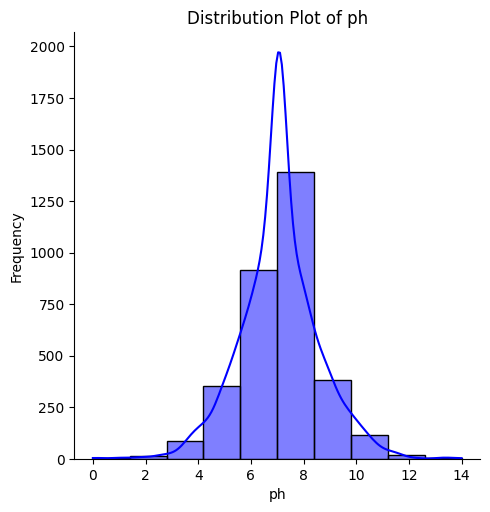

Skewness of ph: 0.027672132589450768


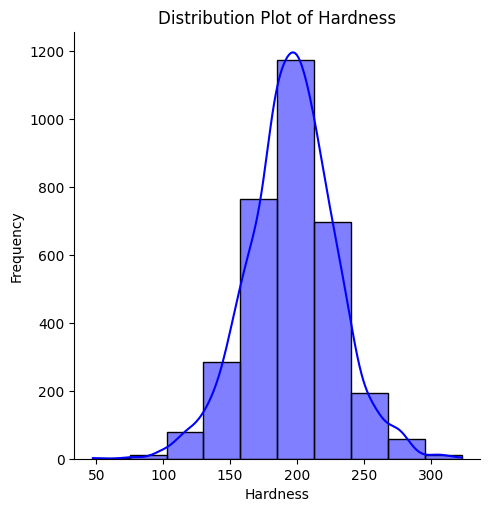

Skewness of Hardness: -0.0393417047767249


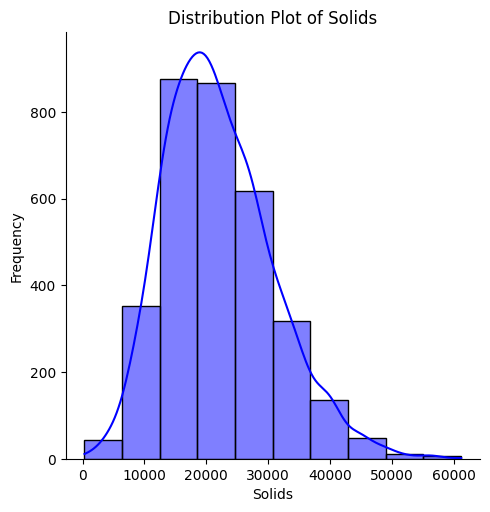

Skewness of Solids: 0.6216344855169127


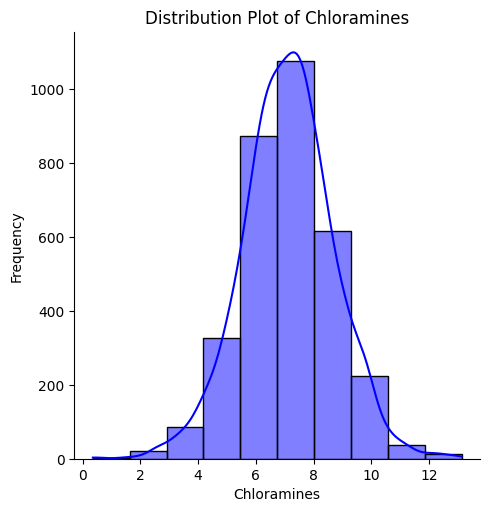

Skewness of Chloramines: -0.01209844012438221


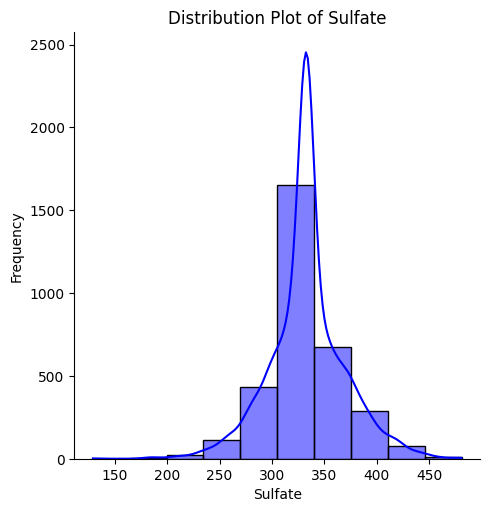

Skewness of Sulfate: -0.022012761444703807


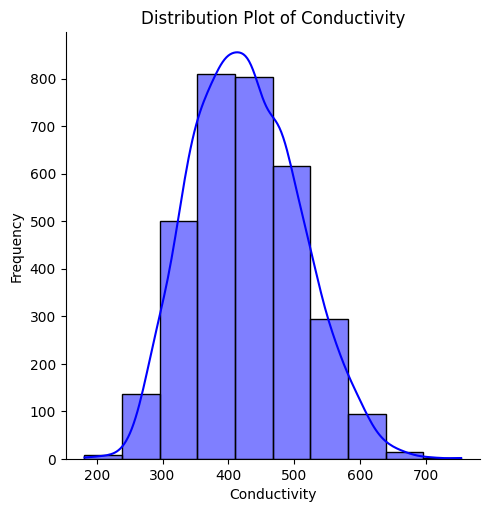

Skewness of Conductivity: 0.2644902239264119


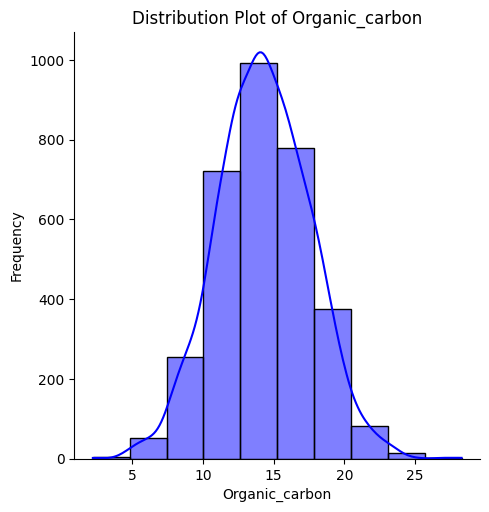

Skewness of Organic_carbon: 0.025532582090242492


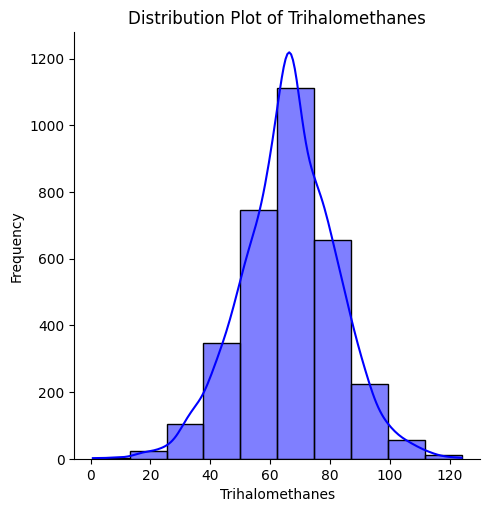

Skewness of Trihalomethanes: -0.08696797890732662


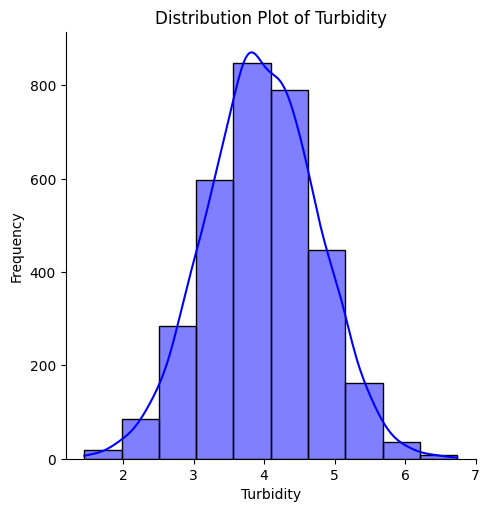

Skewness of Turbidity: -0.007816642377392604


In [ ]:
columns = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']

for column_name in columns:
    # Create a distribution plot (displot)
    sns.displot(df[column_name], bins=10, kde=True, color='blue', edgecolor='black')

    # Add labels and title
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.title(f'Distribution Plot of {column_name}')

    # Show the plot
    plt.show()

    # Calculate skewness
    skewness = df[column_name].skew()

    # Print skewness
    print(f"Skewness of {column_name}: {skewness}")


In [ ]:
def show_distributions(data, col):
    # Create subplots
    fig = make_subplots(
        rows=1, cols=4,
        subplot_titles=['Original Distribution', 'Log Transformation', 'Cubic Root Transformation', 'Square Root Transformation']
    )

    # Plotting the original distribution
    fig.add_trace(
        go.Histogram(x=data[col], nbinsx=30, marker=dict(color='blue')),
        row=1, col=1
    )

    # Plotting the first transformation
    fig.add_trace(
        go.Histogram(x=np.log1p(data[col]), nbinsx=30, marker=dict(color='skyblue')),
        row=1, col=2
    )

    # Plotting the second transformation
    fig.add_trace(
        go.Histogram(x=np.cbrt(data[col]), nbinsx=30, marker=dict(color='salmon')),
        row=1, col=3
    )

    # Plotting the third transformation
    fig.add_trace(
        go.Histogram(x=np.sqrt(data[col]), nbinsx=30, marker=dict(color='green')),
        row=1, col=4
    )

    # Update layout
    fig.update_layout(
        title=f'Distributions for column {col}',
        showlegend=False,
        height=400,
        width=1200  # Adjust width to accommodate the additional subplot
    )

    # Show skewness information
    skewness_info = (
        f"Original skewness = {data[col].skew():.4f}, "
        f"Log skewness = {np.log1p(data[col]).skew():.4f}, "
        f"Cubic root skewness = {np.cbrt(data[col]).skew():.4f}, "
        f"Square root skewness = {np.sqrt(data[col]).skew():.4f}"
    )
    fig.update_layout(annotations=[dict(text=skewness_info, x=0.5, y=-0.2, showarrow=False, xref='paper', yref='paper')])

    # Show the plot
    fig.show()




In [ ]:
columns=['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']

for col in columns:
    show_distributions(df,col)

In [ ]:
ranges = df.max() - df.min()

print(ranges)

ph                    14.000000
Hardness             275.692000
Solids             60906.253396
Chloramines           12.775000
Sulfate              352.030642
Conductivity         571.858866
Organic_carbon        26.100000
Trihalomethanes      123.262000
Turbidity              5.289000
Potability             1.000000
dtype: float64


In [ ]:
mm_scaler=MinMaxScaler()
columns=['Conductivity', 'Solids','Hardness' ,'Sulfate','Trihalomethanes']
for col in columns:
    df[col]=mm_scaler.fit_transform(np.array(df[col]).reshape(-1,1))

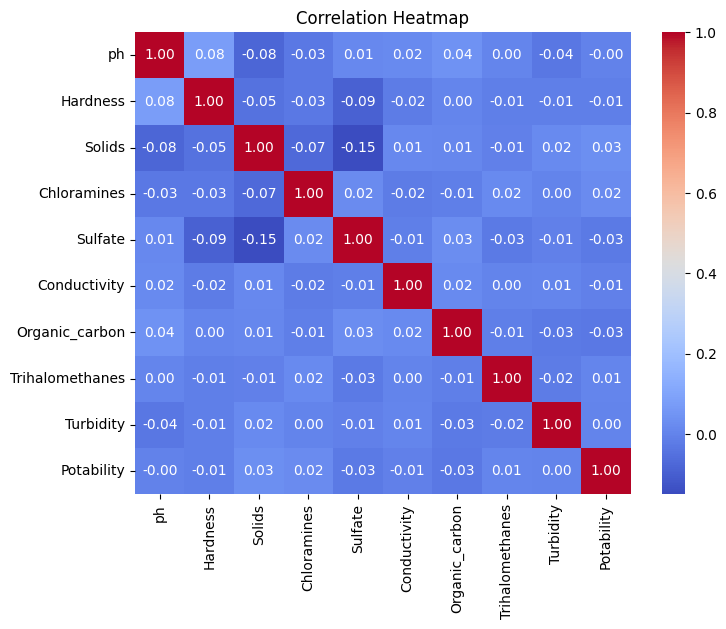

In [ ]:
# Plot the correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
x=df.drop(['Potability'],axis=1)
y=df['Potability']

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42,stratify=y)

In [ ]:
y_train.value_counts()

Potability
0    1598
1    1022
Name: count, dtype: int64

In [ ]:
smote=SMOTE(random_state=42,k_neighbors=7)
x_train,y_train = smote.fit_resample(x_train,y_train)

C:\Users\parth\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:474: FutureWarning:

`BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.



In [ ]:
y_train.value_counts()

Potability
0    1598
1    1598
Name: count, dtype: int64

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV,KFold
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.model_selection import cross_val_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
import warnings
warnings.filterwarnings('ignore')

In [ ]:
knn_model = KNeighborsClassifier()

In [ ]:
knn_param_grid = grid_params = { 'n_neighbors' : [3,5,7,9,11,13,15,17,19,21,23,25,27]}

knn_grid_search = GridSearchCV(knn_model, knn_param_grid, cv=5)

knn_grid_search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23,
                                         25, 27]})

In [ ]:
print("Mean cross-validation scores:")
means=knn_grid_search.cv_results_['mean_test_score']
params=knn_grid_search.cv_results_['params']

for mean_score, param in zip(means, params):
 print(f"{mean_score:.3f} for {param}")

Mean cross-validation scores:
0.622 for {'n_neighbors': 3}
0.615 for {'n_neighbors': 5}
0.594 for {'n_neighbors': 7}
0.587 for {'n_neighbors': 9}
0.590 for {'n_neighbors': 11}
0.594 for {'n_neighbors': 13}
0.591 for {'n_neighbors': 15}
0.589 for {'n_neighbors': 17}
0.586 for {'n_neighbors': 19}
0.580 for {'n_neighbors': 21}
0.583 for {'n_neighbors': 23}
0.580 for {'n_neighbors': 25}
0.580 for {'n_neighbors': 27}


In [ ]:
# Get the best parameters and the best score
best_params = knn_grid_search.best_params_
best_score = knn_grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'n_neighbors': 3}
Best Score: 0.62172877543036


In [ ]:
y_pred=knn_grid_search.predict(x_test)
y_pred_train=knn_grid_search.predict(x_train)

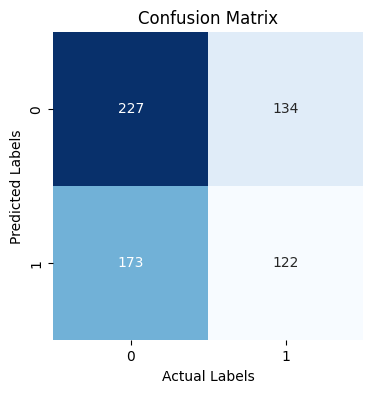

In [ ]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(cm.T, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['0', '1'], yticklabels=['0', '1'])

plt.title('Confusion Matrix')
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')

plt.show()

In [ ]:
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_pred))


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.63      0.57      0.60       400
           1       0.41      0.48      0.44       256

    accuracy                           0.53       656
   macro avg       0.52      0.52      0.52       656
weighted avg       0.54      0.53      0.54       656



In [ ]:
min_samples_split_list = [2,10,20, 30, 50,70, 100,150, 200, 300, 700]
max_depth_list = [1,2, 3, 4,8,10,16,20,25, 32, 64, None]

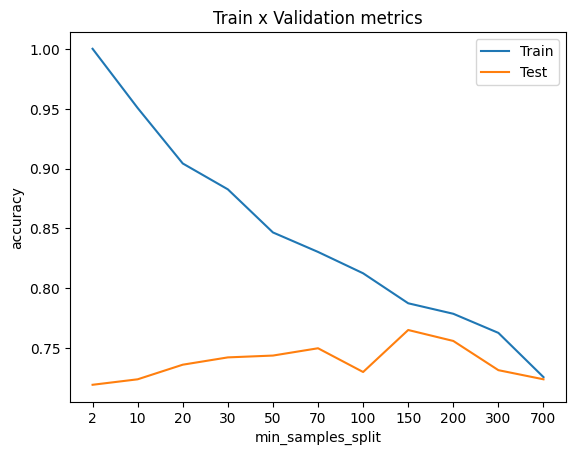

In [ ]:
accuracy_list_train = []
accuracy_list_val = []
for min_samples_split in min_samples_split_list:

    model = DecisionTreeClassifier(min_samples_split = min_samples_split,
                                   random_state = 42).fit(x_train,y_train)
    predictions_train = model.predict(x_train)

    predictions_val = model.predict(x_test)

    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Test'])

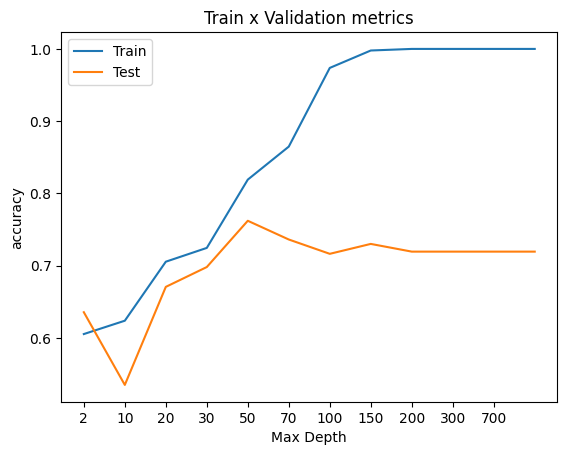

In [ ]:
accuracy_list_train = []
accuracy_list_val = []
for max_depth in max_depth_list:
    # You can fit the model at the same time you define it, because the fit function returns the fitted estimator.
    model = DecisionTreeClassifier(max_depth = max_depth,
                                   random_state = 42).fit(x_train,y_train)
    predictions_train = model.predict(x_train) ## The predicted values for the train dataset

    predictions_val = model.predict(x_test) ## The predicted values for the test dataset

    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('Max Depth')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Test'])

In [ ]:
decision_tree_model = DecisionTreeClassifier(min_samples_split = 150,
                                             max_depth = 30,
                                             random_state = 42)

In [ ]:
# Perform cross-validation
cv_scores = cross_val_score(decision_tree_model, x_train, y_train, cv=10)
decision_tree_model.fit(x_train,y_train)

# Print accuracies for each fold
print("Cross-validation accuracies:", cv_scores)

Cross-validation accuracies: [0.775      0.703125   0.721875   0.75       0.725      0.7375
 0.75548589 0.69592476 0.68652038 0.69278997]


In [ ]:
decision_tree_model.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=30, min_samples_split=150, random_state=42)

In [ ]:
y_pred_train=decision_tree_model.predict(x_train)
y_pred=decision_tree_model.predict(x_test)

In [ ]:
print(f"Metrics train:\n\tAccuracy score: {accuracy_score(y_train,y_pred_train)*100:.1f}")
print(f"Metrics Test:\n\tAccuracy score: {accuracy_score(y_test,y_pred)*100:.1f}")

Metrics train:
	Accuracy score: 78.8
Metrics Test:
	Accuracy score: 76.5


[Text(0.36964285714285716, 0.9642857142857143, 'x[4] <= 0.58\ngini = 0.5\nsamples = 3196\nvalue = [1598, 1598]'),
 Text(0.12857142857142856, 0.8928571428571429, 'x[4] <= 0.576\ngini = 0.476\nsamples = 1535\nvalue = [599, 936]'),
 Text(0.24910714285714286, 0.9285714285714286, 'True  '),
 Text(0.07142857142857142, 0.8214285714285714, 'x[0] <= 5.514\ngini = 0.499\nsamples = 1232\nvalue = [585, 647]'),
 Text(0.04285714285714286, 0.75, 'gini = 0.287\nsamples = 144\nvalue = [119, 25]'),
 Text(0.1, 0.75, 'x[2] <= 0.221\ngini = 0.49\nsamples = 1088\nvalue = [466, 622]'),
 Text(0.07142857142857142, 0.6785714285714286, 'gini = 0.438\nsamples = 142\nvalue = [96, 46]'),
 Text(0.12857142857142856, 0.6785714285714286, 'x[4] <= 0.381\ngini = 0.476\nsamples = 946\nvalue = [370, 576]'),
 Text(0.1, 0.6071428571428571, 'gini = 0.219\nsamples = 80\nvalue = [10, 70]'),
 Text(0.15714285714285714, 0.6071428571428571, 'x[0] <= 6.734\ngini = 0.486\nsamples = 866\nvalue = [360, 506]'),
 Text(0.05714285714285714

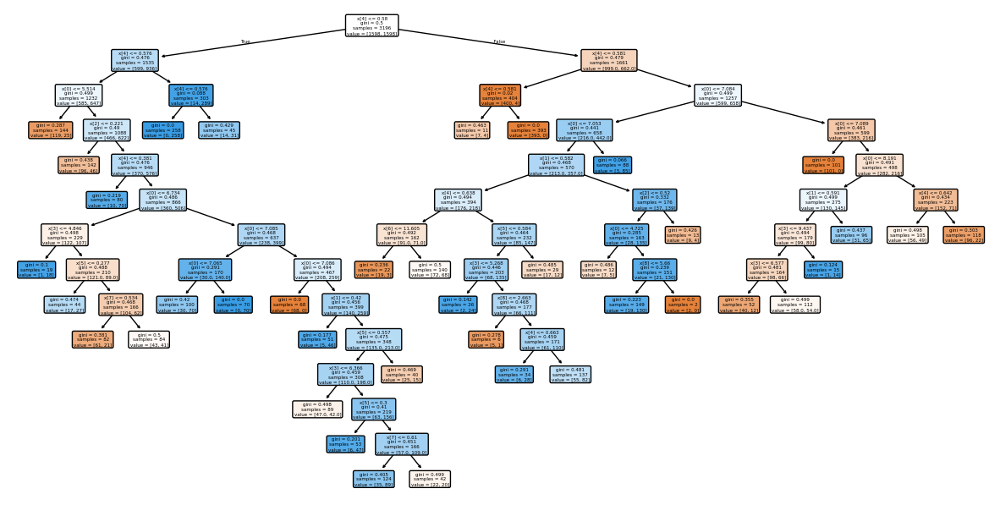

In [ ]:
plt.figure(figsize=(15,7.5))
plot_tree(decision_tree_model,filled=True,rounded=True)

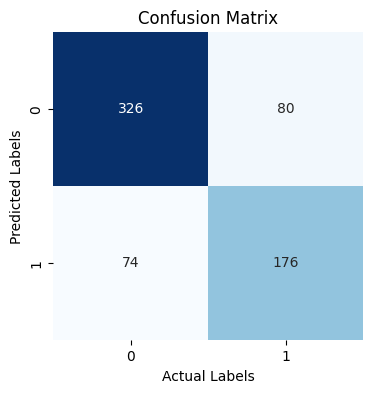

In [ ]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(cm.T, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['0', '1'], yticklabels=['0', '1'])

plt.title('Confusion Matrix')
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')

plt.show()

In [ ]:
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_pred))


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.80      0.81      0.81       400
           1       0.70      0.69      0.70       256

    accuracy                           0.77       656
   macro avg       0.75      0.75      0.75       656
weighted avg       0.76      0.77      0.76       656



In [ ]:
import joblib

In [ ]:
joblib.dump(decision_tree_model,"DecisionTreeClassifier.pkl")

['DecisionTreeClassifier.pkl']

In [ ]:
min_samples_split_list = [2,10,20, 30, 50,70, 100,150, 200, 300, 700]
max_depth_list = [1,2, 3, 4,8,10,16,20,25, 32, 64, None]
n_estimators_list = [10,50,100,200,300,400,500]

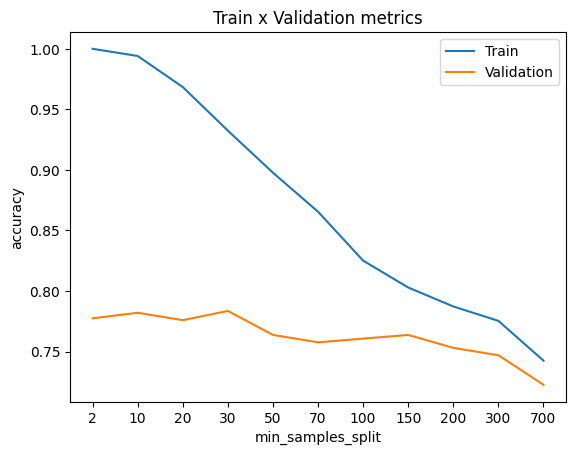

In [ ]:
accuracy_list_train = []
accuracy_list_val = []
for min_samples_split in min_samples_split_list:

    model = RandomForestClassifier(min_samples_split = min_samples_split,
                                   random_state = 42,n_jobs=4).fit(x_train,y_train)
    predictions_train = model.predict(x_train)
    predictions_val = model.predict(x_test)
    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('min_samples_split')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(min_samples_split_list )),labels=min_samples_split_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Validation'])

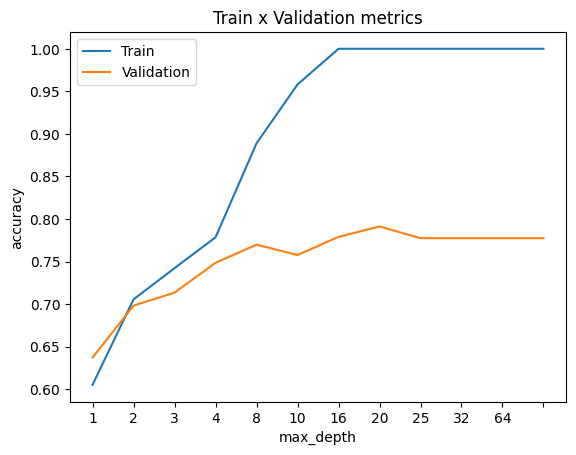

In [ ]:
accuracy_list_train = []
accuracy_list_val = []
for max_depth in max_depth_list:
    # You can fit the model at the same time you define it, because the fit function returns the fitted estimator.
    model = RandomForestClassifier(max_depth = max_depth,
                                   random_state = 42,n_jobs=4).fit(x_train,y_train)
    predictions_train = model.predict(x_train) ## The predicted values for the train dataset
    predictions_val = model.predict(x_test) ## The predicted values for the test dataset
    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(max_depth_list )),labels=max_depth_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Validation'])

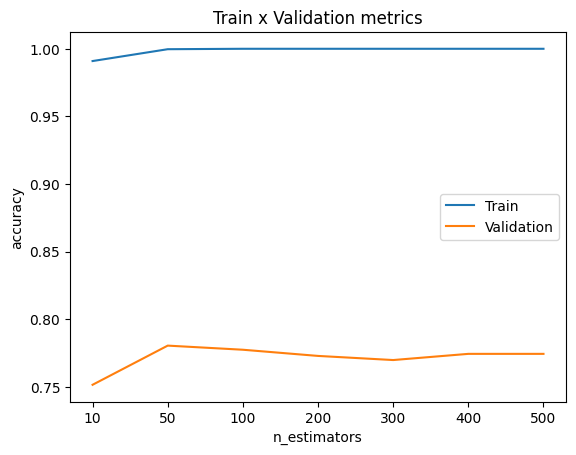

In [ ]:
accuracy_list_train = []
accuracy_list_val = []
for n_estimators in n_estimators_list:
    # You can fit the model at the same time you define it, because the fit function returns the fitted estimator.
    model = RandomForestClassifier(n_estimators = n_estimators,
                                   random_state = 42,n_jobs=4).fit(x_train,y_train)
    predictions_train = model.predict(x_train) ## The predicted values for the train dataset
    predictions_val = model.predict(x_test) ## The predicted values for the test dataset
    accuracy_train = accuracy_score(predictions_train,y_train)
    accuracy_val = accuracy_score(predictions_val,y_test)
    accuracy_list_train.append(accuracy_train)
    accuracy_list_val.append(accuracy_val)

plt.title('Train x Validation metrics')
plt.xlabel('n_estimators')
plt.ylabel('accuracy')
plt.xticks(ticks = range(len(n_estimators_list )),labels=n_estimators_list)
plt.plot(accuracy_list_train)
plt.plot(accuracy_list_val)
plt.legend(['Train','Validation'])

In [ ]:
random_forest_model = RandomForestClassifier(criterion='entropy',
                                             n_estimators = 70,
                                             max_depth = 9,
                                             min_samples_split = 150,n_jobs=4)

In [ ]:
random_forest_model.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, min_samples_split=150,
                       n_estimators=70, n_jobs=4)

In [ ]:
y_pred_train=random_forest_model.predict(x_train)
y_pred=random_forest_model.predict(x_test)

In [ ]:
print(f"Metrics train:\n\tAccuracy score: {accuracy_score(y_train,y_pred_train)*100:.1f}")
print(f"Metrics Test:\n\tAccuracy score: {accuracy_score(y_test,y_pred)*100:.1f}")

Metrics train:
	Accuracy score: 80.0
Metrics Test:
	Accuracy score: 75.5


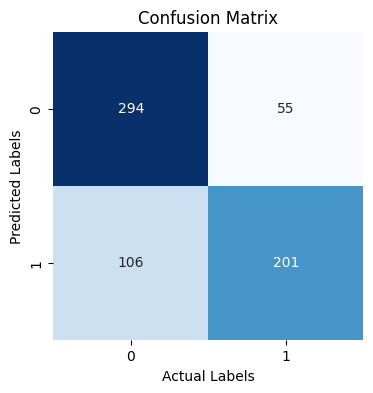

In [ ]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(cm.T, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['0', '1'], yticklabels=['0', '1'])

plt.title('Confusion Matrix')
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')

plt.show()

In [ ]:
lr_model = LogisticRegression(random_state=42)

In [ ]:
# Define the grid of parameters to search
param_grid = {
    'C': [0.0001,0.001,0.01,0.1,1,10,100,1000]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid ,cv=5, n_jobs=4)

# Perform grid search
grid_search.fit(x_train, y_train)

print("Mean cross-validation scores:")
means=grid_search.cv_results_['mean_test_score']
params=grid_search.cv_results_['params']

for mean_score, param in zip(means, params):
 print(f"{mean_score:.3f} for {param}")

Mean cross-validation scores:
0.507 for {'C': 0.0001}
0.502 for {'C': 0.001}
0.489 for {'C': 0.01}
0.483 for {'C': 0.1}
0.479 for {'C': 1}
0.477 for {'C': 10}
0.477 for {'C': 100}
0.477 for {'C': 1000}


In [ ]:
# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and best score
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'C': 0.0001}
Best Score: 0.5065757042253521


In [ ]:
lr_model = LogisticRegression(random_state=42,C=0.0001)
lr_model.fit(x_train,y_train)

LogisticRegression(C=0.0001, random_state=42)

In [ ]:
y_pred=lr_model.predict(x_test)
y_pred_train=lr_model.predict(x_train)

In [ ]:
print(f"Metrics train:\n\tAccuracy score: {accuracy_score(y_train,y_pred_train)*100:.2f}")
print(f"Metrics Test:\n\tAccuracy score: {accuracy_score(y_test,y_pred)*100:.2f}")

Metrics train:
	Accuracy score: 51.50
Metrics Test:
	Accuracy score: 54.73


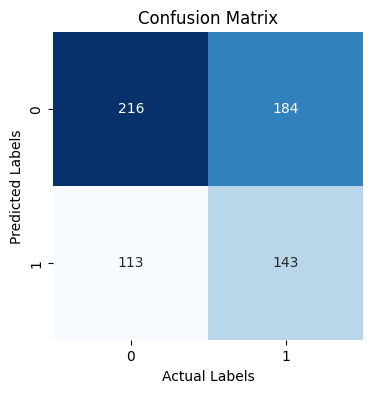

In [ ]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['0', '1'], yticklabels=['0', '1'])

plt.title('Confusion Matrix')
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')

plt.show()

In [ ]:
svm_model = SVC(random_state=42)

In [ ]:
# Define the grid of parameters to search
param_grid = {
    'C': [0.1,2,1,0.3,0.5,0.2],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto'],

}


# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=5, n_jobs=4)

# Perform grid search
grid_search.fit(x_train, y_train)


GridSearchCV(cv=5, estimator=SVC(random_state=42), n_jobs=4,
             param_grid={'C': [0.1, 2, 1, 0.3, 0.5, 0.2],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf']})

In [ ]:
print("Mean cross-validation scores:")
means=grid_search.cv_results_['mean_test_score']
params=grid_search.cv_results_['params']

for mean_score, param in zip(means, params):
 print(f"{mean_score:.3f} for {param}")

Mean cross-validation scores:
0.489 for {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
0.490 for {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.489 for {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
0.570 for {'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}
0.483 for {'C': 2, 'gamma': 'scale', 'kernel': 'linear'}
0.516 for {'C': 2, 'gamma': 'scale', 'kernel': 'rbf'}
0.483 for {'C': 2, 'gamma': 'auto', 'kernel': 'linear'}
0.599 for {'C': 2, 'gamma': 'auto', 'kernel': 'rbf'}
0.485 for {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
0.516 for {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
0.485 for {'C': 1, 'gamma': 'auto', 'kernel': 'linear'}
0.590 for {'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}
0.487 for {'C': 0.3, 'gamma': 'scale', 'kernel': 'linear'}
0.516 for {'C': 0.3, 'gamma': 'scale', 'kernel': 'rbf'}
0.487 for {'C': 0.3, 'gamma': 'auto', 'kernel': 'linear'}
0.575 for {'C': 0.3, 'gamma': 'auto', 'kernel': 'rbf'}
0.486 for {'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
0.511 for {'C':

In [ ]:
# Get the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'C': 2, 'gamma': 'auto', 'kernel': 'rbf'}
Best Score: 0.5985656298904538


In [ ]:
svm_model = SVC(kernel='rbf', C=2, gamma='auto', random_state=42)
svm_model.fit(x_train,y_train)

SVC(C=2, gamma='auto', random_state=42)

In [ ]:
y_pred=svm_model.predict(x_test)
y_pred_train=svm_model.predict(x_train)

In [ ]:
print(f"Metrics train:\n\tAccuracy score: {accuracy_score(y_pred_train,y_train)*100:.2f}")
print(f"Metrics Test:\n\tAccuracy score: {accuracy_score(y_pred,y_test)*100:.2f}")

Metrics train:
	Accuracy score: 65.55
Metrics Test:
	Accuracy score: 56.25


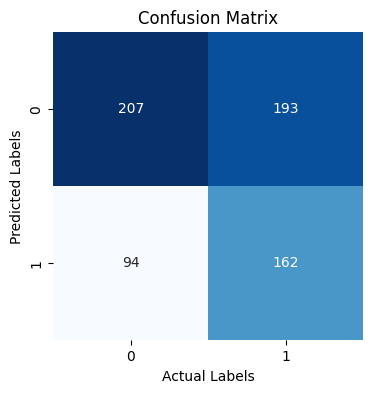

In [ ]:
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['0', '1'], yticklabels=['0', '1'])

plt.title('Confusion Matrix')
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')

plt.show()

In [ ]:
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_pred))


Classification Report for Test Set:
              precision    recall  f1-score   support

           0       0.69      0.52      0.59       400
           1       0.46      0.63      0.53       256

    accuracy                           0.56       656
   macro avg       0.57      0.58      0.56       656
weighted avg       0.60      0.56      0.57       656



In [ ]:
import numpy as np
import pandas as pd
import joblib

# Load the trained model
model = joblib.load("DecisionTreeClassifier.pkl")  # Change filename if needed

# Function for manual testing
def manual_testing():
    print("\n🔹 Enter the water sample details for prediction:")
    
    # User input for all features
    ph = float(input("Enter pH level: "))
    hardness = float(input("Enter Hardness: "))
    solids = float(input("Enter Solids: "))
    chloramines = float(input("Enter Chloramines: "))
    sulfate = float(input("Enter Sulfate: "))
    conductivity = float(input("Enter Conductivity: "))
    organic_carbon = float(input("Enter Organic Carbon: "))
    trihalomethanes = float(input("Enter Trihalomethanes: "))
    turbidity = float(input("Enter Turbidity: "))

    # Convert input into DataFrame (same format as training data)
    input_data = pd.DataFrame([[ph, hardness, solids, chloramines, sulfate, conductivity, organic_carbon, trihalomethanes, turbidity]],
                              columns=['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity'])
    
    # Predict potability using loaded model
    prediction = model.predict(input_data)[0]

    # Display Result
    if prediction == 1:
        print("\n✅ **The water is POTABLE (Safe to Drink).**")
    else:
        print("\n❌ **The water is NOT POTABLE (Unsafe to Drink).**")

# Run the manual testing function
manual_testing()



🔹 Enter the water sample details for prediction:


Enter pH level:  8.9
Enter Hardness:  120
Enter Solids:  19000
Enter Chloramines:  0.5
Enter Sulfate:  400
Enter Conductivity:  600
Enter Organic Carbon:  17.5
Enter Trihalomethanes:  130
Enter Turbidity:  6.2



❌ **The water is NOT POTABLE (Unsafe to Drink).**
